<a href="https://colab.research.google.com/github/oz03-hub/catGAN/blob/main/catGanUser.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# /content/
! rm -rf /content/cats
! rm -rf /content/celebs
! cp /content/drive/MyDrive/cs389/cats.zip /content/
! cp /content/drive/MyDrive/cs389/celebs.zip /content/
! rm -rf /content/cats
! rm -rf /content/celebs
! unzip /content/cats.zip -d /content/
! unzip /content/celebs.zip -d /content/
! rm /content/celebs/.DS_Store
! rm /content/cats/.DS_Store
! rm -rf /content/__MACOSX/
! rm -rf /content/__MACOSX/

In [ ]:
import torchvision.transforms as transforms
from torchvision import datasets, transforms
import torchvision
import matplotlib.pyplot as plt
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torch.autograd import Variable
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
import itertools
import numpy as np
import tqdm
import os
import glob
import random
from tqdm import tqdm

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.set_default_device(device)
print(device)

cuda


In [ ]:
class ImageDataset(Dataset):
    def __init__(self, path='/content/celebs/celebs_dataset/*.*'):
        self.transform = transforms.Compose([transforms.Resize((128, 128), Image.BICUBIC),
                transforms.ToTensor()])

        self.files_A = sorted(glob.glob(path))
        self.files_B = sorted(glob.glob('/content/cats/cats_dataset/*.jpg'))
        self.unaligned = False

    def __getitem__(self, index):
        item_A = self.transform(Image.open(self.files_A[index % len(self.files_A)]))

        if self.unaligned:
            item_B = self.transform(Image.open(self.files_B[random.randint(0, len(self.files_B) - 1)]))
        else:
            item_B = self.transform(Image.open(self.files_B[index % len(self.files_B)]))

        return {'A': item_A, 'B': item_B}

    def __len__(self):
        return len(self.files_A)

In [ ]:
class Generator(nn.Module):
  def __init__(self): # 3, 128, 128
    super(Generator, self).__init__()

    # encoder layer
    model = [
        # Layer 1, (3, 128, 128)
        nn.Conv2d(3, 64, 8, padding=4),
        nn.InstanceNorm2d(64),
        nn.ReLU(inplace=True),

        # Layer 2, (64, 127, 127)
        nn.Conv2d(64, 128, 3, stride=2, padding=2, padding_mode="reflect"),
        nn.InstanceNorm2d(128),
        nn.ReLU(inplace=True),

        # Layer 3, (128, 65, 65)
        nn.Conv2d(128, 256, 3, stride=2, padding=1, padding_mode="reflect"),
        nn.InstanceNorm2d(256),
        nn.ReLU(inplace=True),
    ]

    # residuals
    model += [
        # Layer 4, (256, 33, 33)
        nn.Conv2d(256, 256, 3, padding=1, padding_mode="reflect"),
        nn.InstanceNorm2d(256),
        nn.ReLU(inplace=True),
        nn.Conv2d(256, 256, 3, padding=1, padding_mode="reflect"),
        nn.InstanceNorm2d(256),
        nn.Identity(),

        # Layer 5, (256, 33, 33)
        nn.Conv2d(256, 256, 3, padding=1, padding_mode="reflect"),
        nn.InstanceNorm2d(256),
        nn.ReLU(inplace=True),
        nn.Conv2d(256, 256, 3, padding=1, padding_mode="reflect"),
        nn.InstanceNorm2d(256),
        nn.Identity(),

        # Layer 6, (256, 33, 33)
        nn.Conv2d(256, 256, 3, padding=1, padding_mode="reflect"),
        nn.InstanceNorm2d(256),
        nn.ReLU(inplace=True),
        nn.Conv2d(256, 256, 3, padding=1, padding_mode="reflect"),
        nn.InstanceNorm2d(256),
        nn.Identity(),

        # Layer 7, (256, 33, 33)
        nn.Conv2d(256, 256, 3, padding=1, padding_mode="reflect"),
        nn.InstanceNorm2d(256),
        nn.ReLU(inplace=True),
        nn.Conv2d(256, 256, 3, padding=1, padding_mode="reflect"),
        nn.InstanceNorm2d(256),
        nn.Identity(),

        # Layer (8), (256, 33, 33)
        nn.Conv2d(256, 256, 3, padding=1, padding_mode="reflect"),
        nn.InstanceNorm2d(256),
        nn.ReLU(inplace=True),
        nn.Conv2d(256, 256, 3, padding=1, padding_mode="reflect"),
        nn.InstanceNorm2d(256),
        nn.Identity(),

        # Layer (9), (256, 33, 33)
        # nn.Conv2d(256, 256, 3, padding=1, padding_mode="reflect"),
        # nn.InstanceNorm2d(256),
        # nn.ReLU(inplace=True),
        # nn.Conv2d(256, 256, 3, padding=1, padding_mode="reflect"),
        # nn.InstanceNorm2d(256),
        # nn.Identity(),
    ]

    # decoder
    model += [
        # Layer 8, (256, 33, 33)
        nn.ConvTranspose2d(256, 128, 3, padding=1, stride=2),
        nn.InstanceNorm2d(128),
        nn.ReLU(inplace=True),

        # Layer 9, (128, 65, 65)
        nn.ConvTranspose2d(128, 64, 3, padding=2, stride=2),
        nn.InstanceNorm2d(64),
        nn.ReLU(inplace=True),

        # Layer 10, (64, 127, 127)
        nn.ConvTranspose2d(64, 3, 8, padding=3),
        nn.Sigmoid()
        # (3, 128, 128)
    ]

    self.model = nn.Sequential(*model)

  def forward(self, x):
    x = self.model(x)
    # x = torch.tanh(x)

    return x

In [ ]:
def show_batch(real_batch, fake_batch, recon_batch):
  grid_img_real = torchvision.utils.make_grid(real_batch, nrow=5)
  grid_img_fake = torchvision.utils.make_grid(fake_batch, nrow=5)
  grid_img_recon = torchvision.utils.make_grid(recon_batch, nrow=5)

  fig = plt.figure(figsize=(10, 10))
  plt.subplot(3, 1, 1)
  plt.imshow(grid_img_real.permute(1, 2, 0))
  plt.subplot(3, 1, 2)
  plt.imshow(grid_img_fake.permute(1, 2, 0))
  plt.subplot(3, 1, 3)
  plt.imshow(grid_img_recon.permute(1, 2, 0))
  plt.show()

In [ ]:
img_set = ImageDataset()
loader = DataLoader(img_set, batch_size=16)

In [ ]:
GEN_A2B_PATH = '/content/drive/MyDrive/cs389/models/may63/gena2b.pth'
GEN_B2A_PATH = '/content/drive/MyDrive/cs389/models/may63/genb2a.pth'

gen_a2b = Generator()
gen_a2b.load_state_dict(torch.load(GEN_A2B_PATH)["state_dict"])
gen_a2b.eval()

gen_b2a = Generator()
gen_b2a.load_state_dict(torch.load(GEN_B2A_PATH)["state_dict"])
gen_b2a.eval()

Generator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(8, 8), stride=(1, 1), padding=(4, 4))
    (1): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(2, 2), padding_mode=reflect)
    (4): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (5): ReLU(inplace=True)
    (6): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), padding_mode=reflect)
    (7): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (8): ReLU(inplace=True)
    (9): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=reflect)
    (10): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=reflect)
   

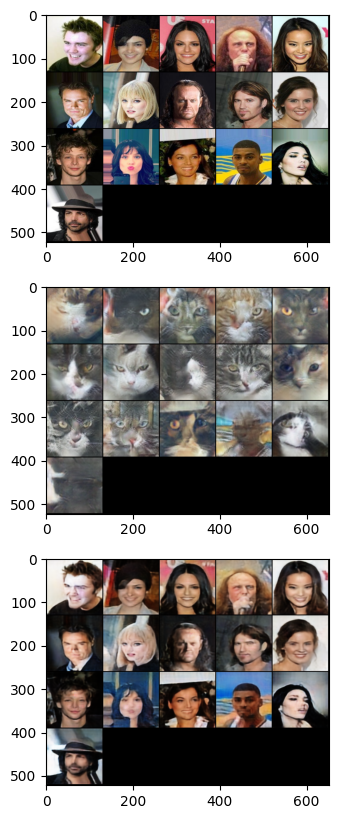

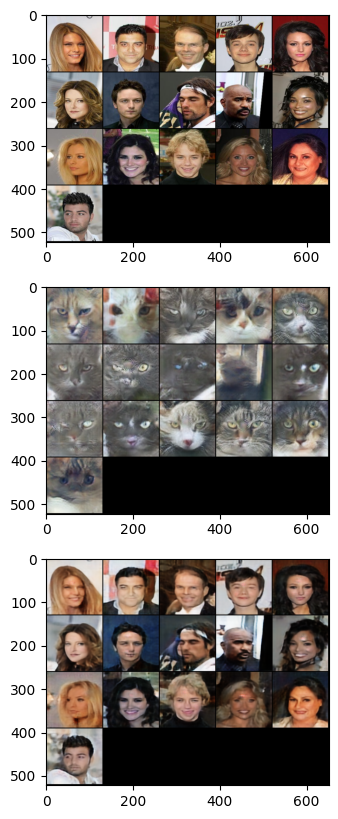

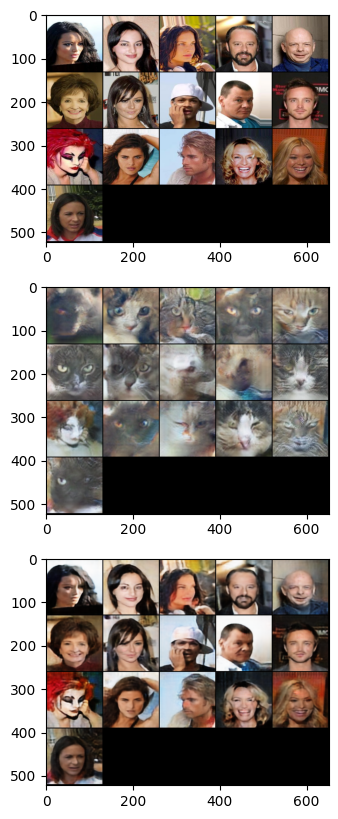

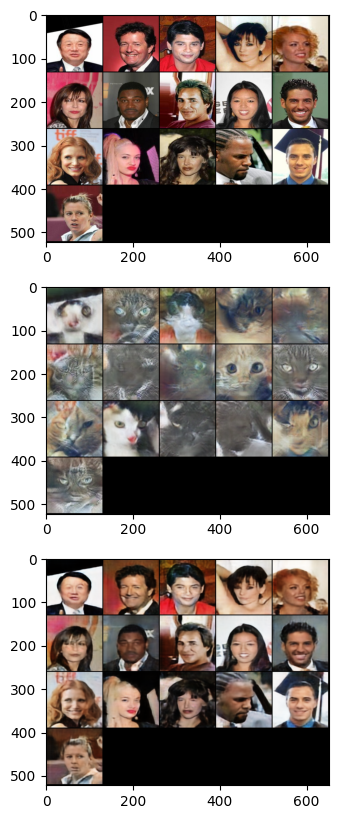

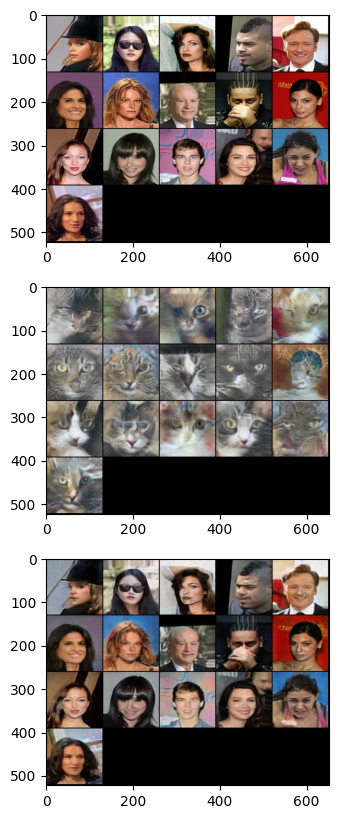

...

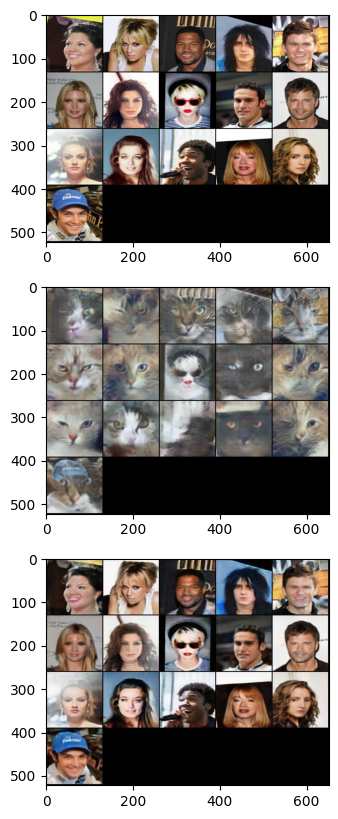

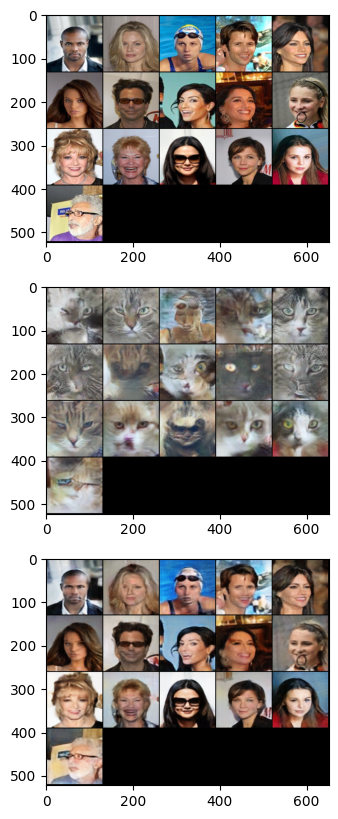

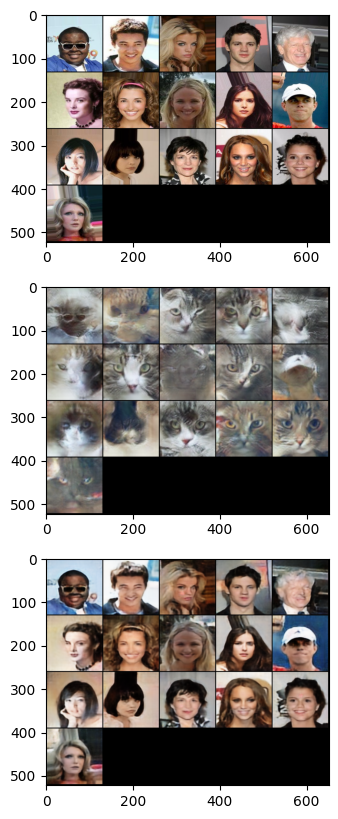

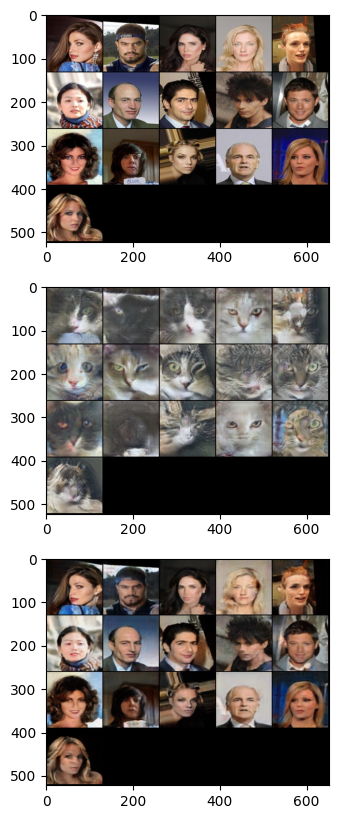

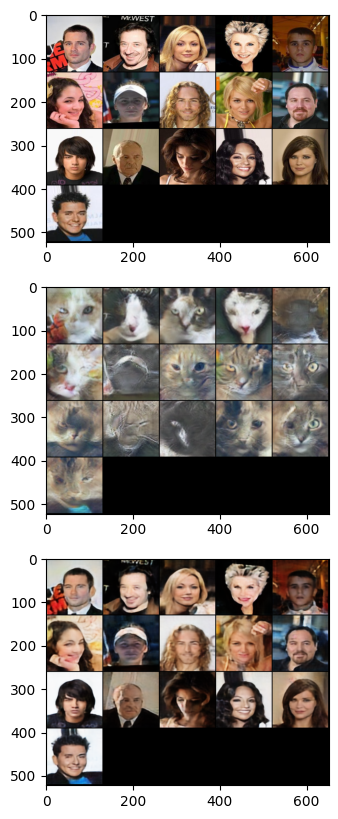

In [ ]:
saved_batches = []

for i, b in enumerate(loader):
  if i > 10:
    break

  A = b['A'].to(device)

  fake_B = gen_a2b(A)
  recon_A = gen_b2a(fake_B)
  A = A.detach().cpu()
  fake_B = fake_B.detach().cpu()
  recon_A = recon_A.detach().cpu()
  saved_batches.append((A, fake_B, recon_A))

for b in saved_batches:
  show_batch(*b)

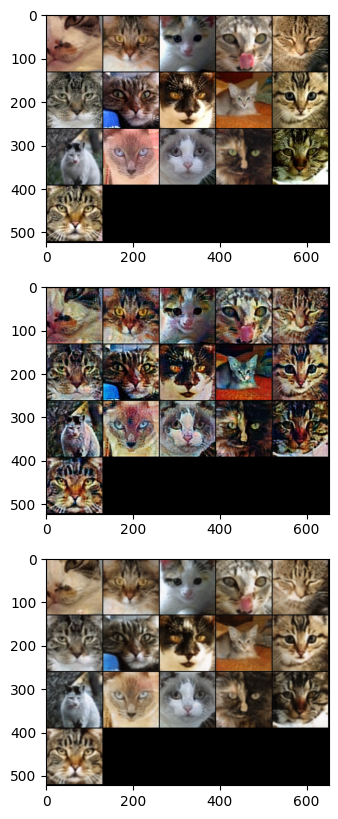

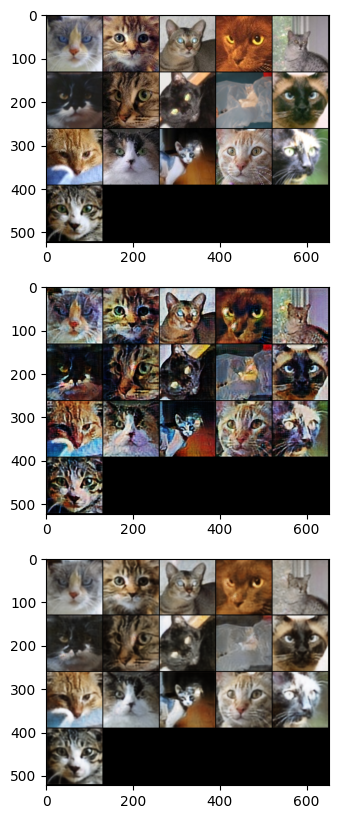

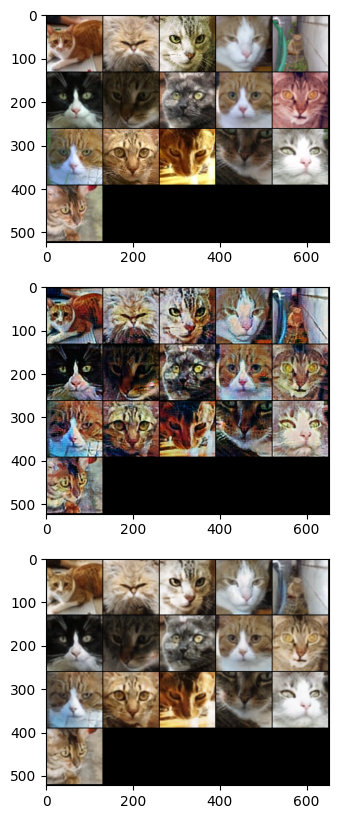

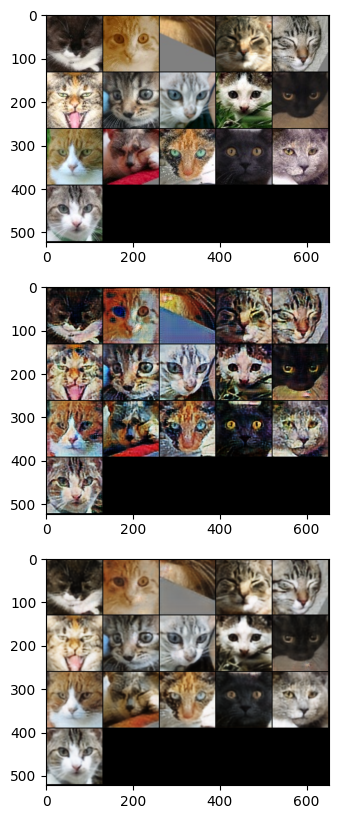

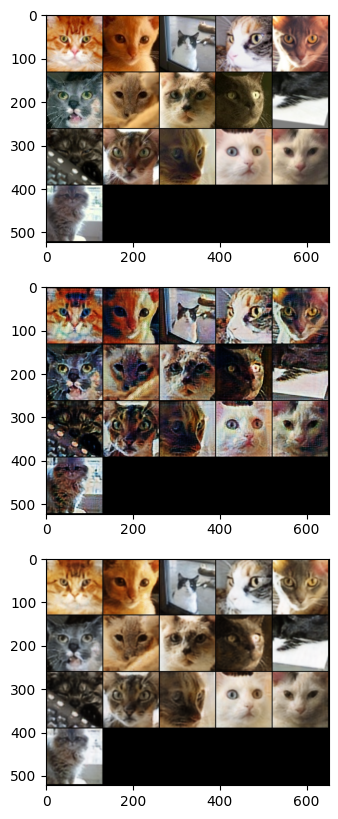

...

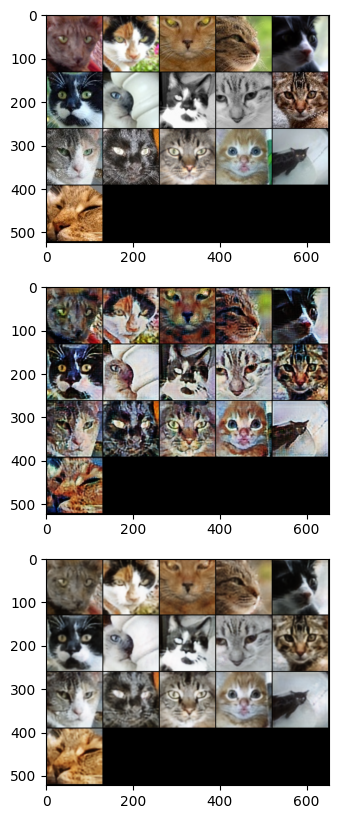

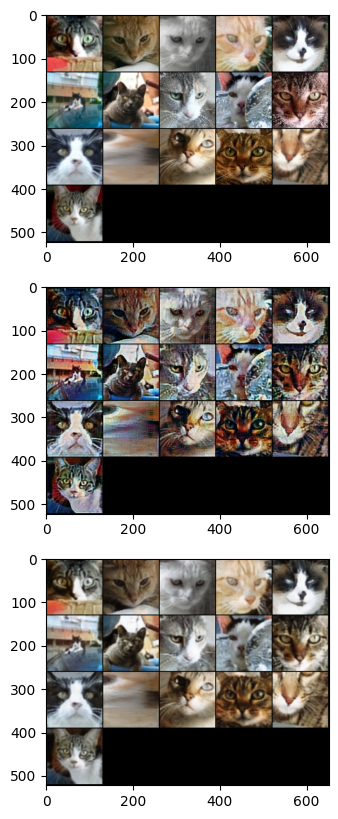

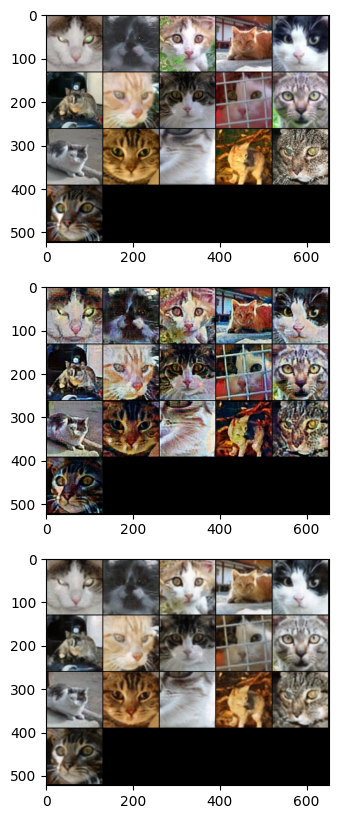

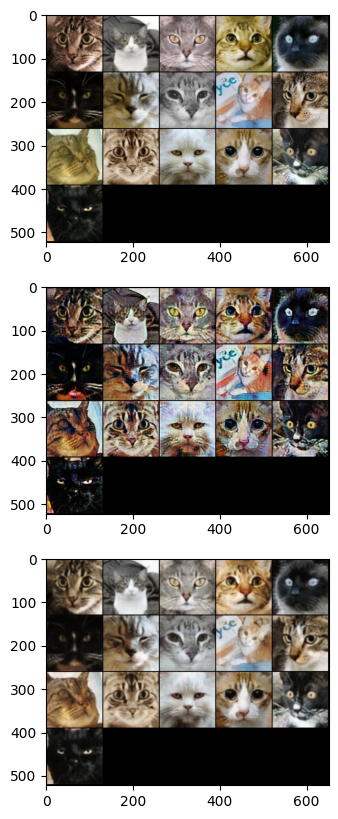

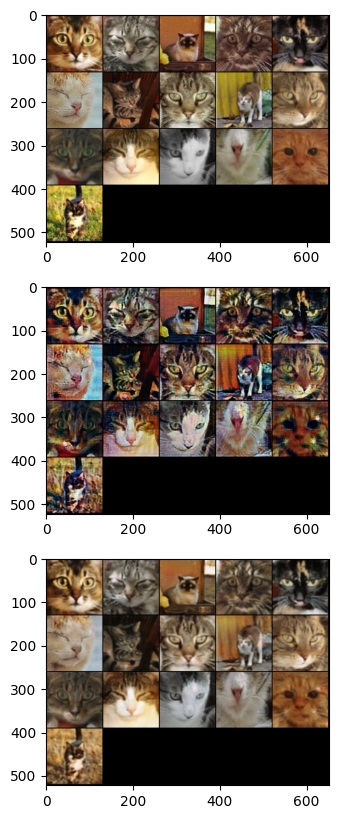

In [ ]:
saved_batches = []

for i, b in enumerate(loader):
  if i > 10:
    break

  B = b['B'].to(device)

  fake_A = gen_b2a(B)
  recon_B = gen_a2b(fake_A)
  B = B.detach().cpu()
  fake_A = fake_A.detach().cpu()
  recon_B = recon_B.detach().cpu()
  saved_batches.append((B, fake_A, recon_B))

for b in saved_batches:
  show_batch(*b)

Archive:  /content/data.zip
   creating: /content/data/
  inflating: /content/data/63c50b0159dbdee4c407ed91c0f8b2f43ebd06f5.jpeg  
  inflating: /content/__MACOSX/data/._63c50b0159dbdee4c407ed91c0f8b2f43ebd06f5.jpeg  
  inflating: /content/data/tim.jpg   
  inflating: /content/__MACOSX/data/._tim.jpg  
  inflating: /content/data/.DS_Store  
  inflating: /content/__MACOSX/data/._.DS_Store  
  inflating: /content/data/mimi.jpg  
  inflating: /content/__MACOSX/data/._mimi.jpg  
  inflating: /content/data/goat.jpeg  
  inflating: /content/__MACOSX/data/._goat.jpeg  
  inflating: /content/data/eliot_moss_550.jpg  
  inflating: /content/__MACOSX/data/._eliot_moss_550.jpg  
  inflating: /content/data/coopers.jpeg  
  inflating: /content/__MACOSX/data/._coopers.jpeg  
  inflating: /content/data/IMG_9617.jpeg  
  inflating: /content/__MACOSX/data/._IMG_9617.jpeg  
  inflating: /content/data/scott.jpeg  
  inflating: /content/__MACOSX/data/._scott.jpeg  
  inflating: /content/data/IMG_9563.jpeg  

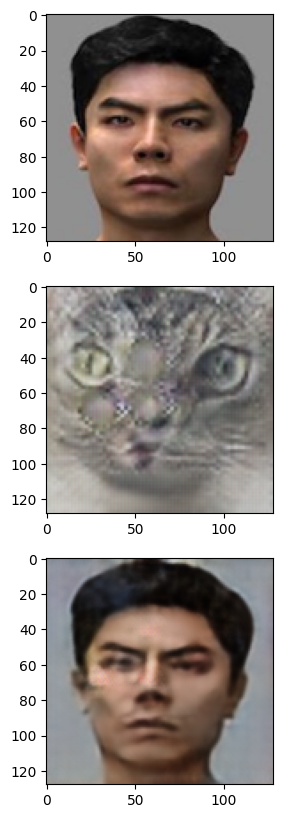

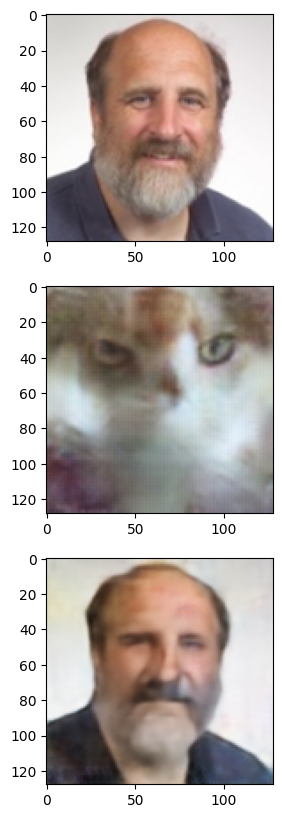

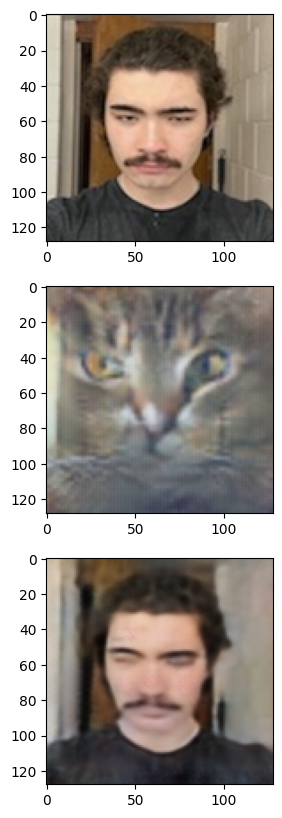

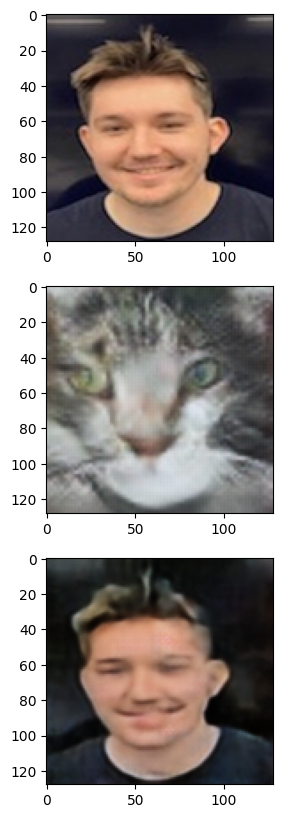

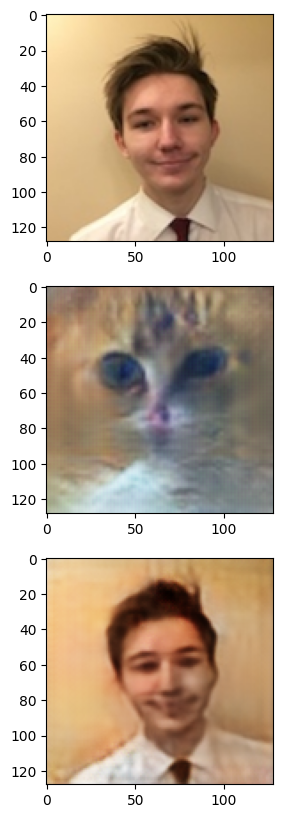

...

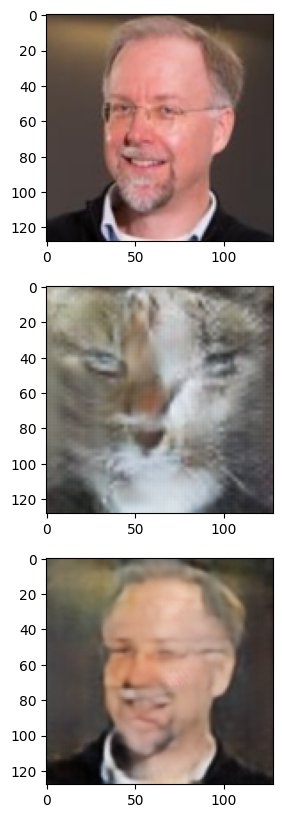

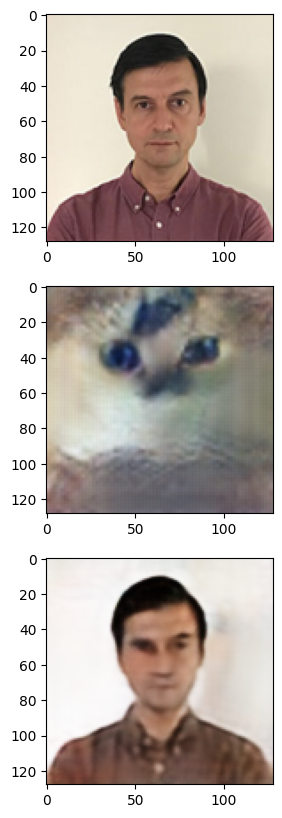

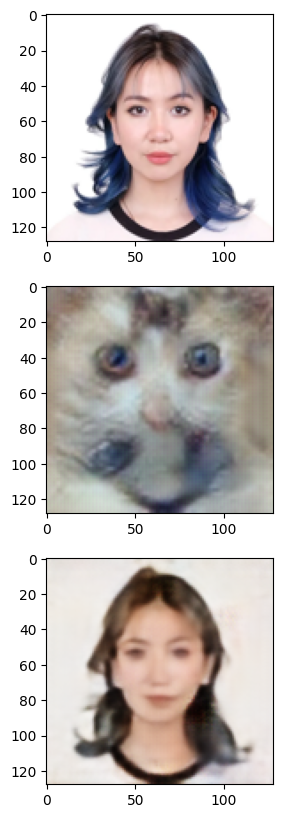

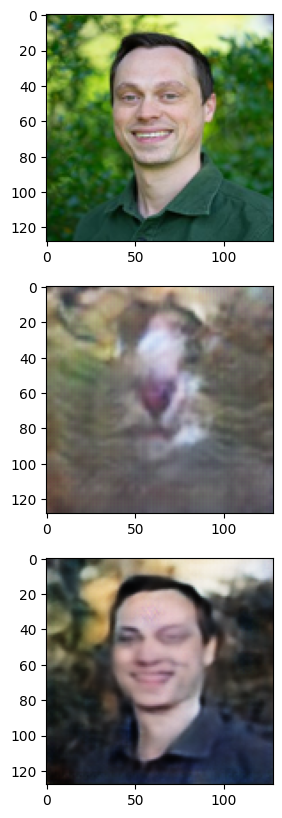

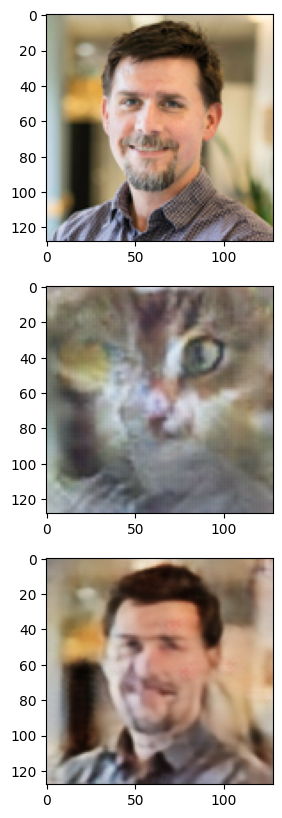

In [ ]:
!rm -rf /content/__MACOSX
!rm -rf /content/data
!unzip /content/data.zip -d /content/
!rm -rf /content/__MACOSX

img_set = ImageDataset('/content/data/*.*')
loader = DataLoader(img_set, batch_size=1)

saved_batches = []

for i, b in enumerate(loader):
  if i > 10:
    break

  A = b['A'].to(device)

  fake_B = gen_a2b(A)
  recon_A = gen_b2a(fake_B)
  A = A.detach().cpu()
  fake_B = fake_B.detach().cpu()
  recon_A = recon_A.detach().cpu()
  saved_batches.append((A, fake_B, recon_A))

for b in saved_batches:
  show_batch(*b)

<IPython.core.display.Javascript object>

Saved square photo to: square_photo.jpg
Resized image shape: torch.Size([3, 128, 128])


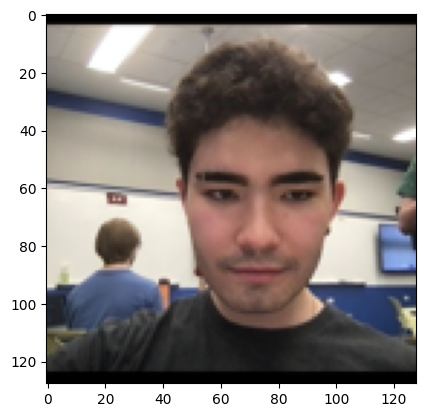

In [ ]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_square_photo(filename='photo.jpg', quality=0.8, square_size=128):
    js = Javascript('''
        async function takePhoto(quality, squareSize) {
            const div = document.createElement('div');
            const capture = document.createElement('button');
            capture.textContent = 'Capture';
            div.appendChild(capture);

            const video = document.createElement('video');
            video.style.display = 'block';
            const stream = await navigator.mediaDevices.getUserMedia({ video: true });

            document.body.appendChild(div);
            div.appendChild(video);
            video.srcObject = stream;
            await video.play();

            // Resize the output to fit the video element.
            google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

            // Wait for Capture to be clicked.
            await new Promise((resolve) => capture.onclick = resolve);

            const canvas = document.createElement('canvas');
            canvas.width = squareSize;
            canvas.height = squareSize;
            const context = canvas.getContext('2d');

            // Calculate the cropping area (centered square)
            const xOffset = (video.videoWidth - squareSize) / 2;
            const yOffset = (video.videoHeight - squareSize) / 2;
            context.drawImage(video, xOffset, yOffset, squareSize, squareSize, 0, 0, squareSize, squareSize);

            stream.getVideoTracks()[0].stop();
            div.remove();
            return canvas.toDataURL('image/jpeg', quality);
        }
    ''')
    display(js)
    data = eval_js('takePhoto({}, {})'.format(quality, square_size))
    binary = b64decode(data.split(',')[1])
    with open(filename, 'wb') as f:
        f.write(binary)
    return filename

# Example usage:
square_image_path = take_square_photo(filename='square_photo.jpg', square_size=512)
print('Saved square photo to:', square_image_path)

from PIL import Image
import torch
from torchvision import transforms

def load_and_reshape_image(image_path):
    image = Image.open(image_path)

    # Resize the image to (128, 128)
    transform = transforms.Compose([
        transforms.Resize((128, 128), Image.BICUBIC),
        transforms.ToTensor(),
    ])
    resized_image = transform(image)

    return resized_image

image_path = '/content/square_photo.jpg'
resized_image = load_and_reshape_image(image_path)
print("Resized image shape:", resized_image.shape)  # Should be (3, 128, 128)
plt.imshow(resized_image.permute(1, 2, 0))
plt.show()

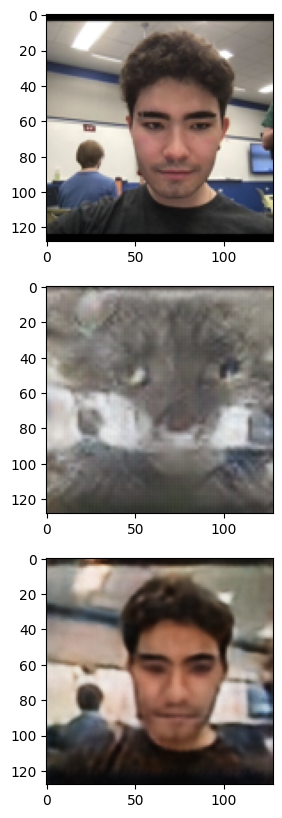

In [ ]:
A = resized_image
A = A.to(device)
fake_B = gen_a2b(A)
recon_A = gen_b2a(fake_B)

A = A.detach().cpu()
fake_B = fake_B.detach().cpu()
recon_A = recon_A.detach().cpu()

show_batch(A, fake_B, recon_A)